# DSAI5207 Lab 03: Optimization & Generalization (Comprehensive)
## From Vanishing Gradients to Double Descent

**Course:** DSAI5207 Modern Deep Learning  
**Instructor:** Prof. Xingyi Yang  

---

### 🧪 Lab Roadmap

This session covers the full arc of the lecture:

1.  **Optimization Geometry:** Visualizing Saddle Points (Slide 26).
2.  **The Engine:** Comparing SGD, Momentum, and Adam (Slide 68).
3.  **Deep Trainability:** Why **Batch Norm** beats simple Initialization (Slide 99).
4.  **Generalization I:** Visualizing **Flat vs. Sharp Minima** (Slide 114).
5.  **Modern Regularization:** **Mixup** Augmentation (Slide 125).


In [147]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import seaborn as sns

# Set seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

plt.style.use('seaborn')
%matplotlib inline
print("Libraries loaded. Ready for experiments.")

Libraries loaded. Ready for experiments.


---
### Part 1: Optimization Geometry (Saddle Points)

**Recall Slide 24:** In high dimensions, most critical points are saddle points, not local minima.

❓ **Question:** Why does Newton's Method (which uses curvature) struggle here, while noisy SGD succeeds?

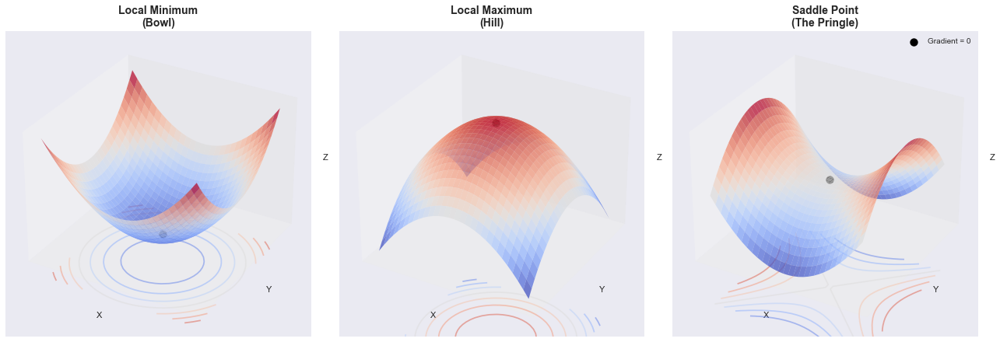

In [42]:
# --- 1. Define the Landscapes ---
def local_minimum(x, y):
    # Positive curvature in both X and Y
    return x**2 + y**2

def local_maximum(x, y):
    # Negative curvature in both X and Y
    return -(x**2 + y**2)

def saddle_point(x, y):
    # Positive curvature in X, Negative in Y
    return x**2 - y**2

# --- 2. Visualization Logic ---
def plot_critical_points():
    # Create grid
    x = np.linspace(-2, 2, 30)
    y = np.linspace(-2, 2, 30)
    X, Y = np.meshgrid(x, y)

    # Setup Figure
    fig = plt.figure(figsize=(18, 6))
    
    # List of landscapes to plot
    landscapes = [
        {"func": local_minimum, "title": "Local Minimum\n(Bowl)", "z_offset": -2},
        {"func": local_maximum, "title": "Local Maximum\n(Hill)", "z_offset": -8},
        {"func": saddle_point,  "title": "Saddle Point\n(The Pringle)", "z_offset": -4}
    ]

    for i, land in enumerate(landscapes):
        ax = fig.add_subplot(1, 3, i+1, projection='3d')
        
        # Calculate Z
        Z = land["func"](X, Y)
        
        # 1. Plot the Surface
        # rstride/cstride controls the wireframe density
        surf = ax.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.7, 
                               rstride=1, cstride=1, edgecolor='none')
        
        # 2. Add Contours on the "floor" for depth perception
        # We offset them slightly below the min Z value so they don't clip
        ax.contour(X, Y, Z, zdir='z', offset=np.min(Z) + land["z_offset"], cmap='coolwarm', alpha=0.5)
        
        # 3. Mark the Critical Point (0,0,0)
        # Note: We calculate the actual Z at (0,0)
        z_center = land["func"](0, 0)
        ax.scatter([0], [0], [z_center], color='black', s=100, label='Gradient = 0', zorder=10)

        # Styling
        ax.set_title(land["title"], fontsize=14, fontweight='bold')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        
        # Remove axis ticks for cleaner look
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        
        # Adjust view angle for best perspective
        ax.view_init(elev=30, azim=-60)

    # Add a global legend
    plt.tight_layout()
    plt.legend(loc='upper right')
    plt.show()

plot_critical_points()

---
# Part 2: The "Torture Test" Suite for Optimizers

In this section, we move beyond simple quadratic valleys. Real-world loss landscapes in Deep Learning are **Non-Convex**. They contain:
* **Curved Valleys** (Rosenbrock)
* **Multiple Basins** (Himmelblau)
* **Local Traps** (Ackley)

We will stress-test SGD, Momentum, and Adam against these difficult geometries to see where they fail.



In [130]:
# --- 1. Define Optimization Functions ---

def narrow_valley(x, y):
    """Simple ill-conditioned quadratic."""
    return 0.5 * x**2 + 20 * y**2

def beale_function(x, y):
    """High curvature valley."""
    return (1.5 - x + x*y)**2 + (2.25 - x + x*y**2)**2 + (2.625 - x + x*y**3)**2

def rastrigin(x, y):
    """Many local minima (egg carton)."""
    A = 10
    if not torch.is_tensor(x): x, y = torch.tensor(x), torch.tensor(y)
    return A * 2 + (x**2 - A * torch.cos(2 * torch.pi * x)) + (y**2 - A * torch.cos(2 * torch.pi * y))

def styblinski_tang(x, y):
    """Irregular non-convexity."""
    return ( (x**4 - 16*x**2 + 5*x) + (y**4 - 16*y**2 + 5*y) ) / 2

def rosenbrock(x, y):
    """
    The 'Banana' Function.
    Global Minimum: (1, 1) inside a long, narrow, curved valley.
    """
    a, b = 1, 100
    return (a - x)**2 + b * (y - x**2)**2

def himmelblau(x, y):
    """
    The 'Four-Basin' Function.
    Has 4 identical global minima. Which one you hit depends on where you start.
    """
    return (x**2 + y - 11)**2 + (x + y**2 - 7)**2

def ackley(x, y):
    """
    The 'Porcupine' Function.
    A deep hole surrounded by a flat outer region full of local traps.
    """
    if not torch.is_tensor(x): x, y = torch.tensor(x), torch.tensor(y)
    term1 = -20 * torch.exp(-0.2 * torch.sqrt(0.5 * (x**2 + y**2)))
    term2 = -torch.exp(0.5 * (torch.cos(2 * np.pi * x) + torch.cos(2 * np.pi * y)))
    return term1 + term2 + np.e + 20

def matyas(x, y):
    """
    The 'Plate' Function.
    Simple convex shape, but gradients point slightly away from center.
    """
    return 0.26 * (x**2 + y**2) - 0.48 * x * y

In [143]:
# --- 2. "Safe" Configuration Dictionary ---
# Maps functions to their viewing angles, start points, and specific learning rates.

FUNC_CONFIGS = {
    narrow_valley: {
        "name": "Narrow Valley",
        "xlim": (-10, 10), "ylim": (-3, 3),
        "start": [-9.0, 2.5],
        "levels": np.logspace(-1, 3, 25),
        "zlim": (0, 300),
        "base_lr": 0.02,
        "clip": 5.0
    },
    beale_function: {
        "name": "Beale Function (High Curvature)",
        "xlim": (-3.5, 3.5), "ylim": (-3.5, 3.5),
        "start": [0.5, 0.5], 
        "levels": np.logspace(-1, 5, 30),
        "zlim": (0, 2000),
        "base_lr": 0.005,
        "clip": 1.0
    },
    rastrigin: {
        "name": "Rastrigin (Local Minima)",
        "xlim": (-5.12, 5.12), "ylim": (-5.12, 5.12),
        "start": [4.0, 3.5],
        "levels": np.linspace(0, 100, 25),
        "zlim": (0, 100),
        "base_lr": 0.05,
        "clip": 5.0
    },
    styblinski_tang: {
        "name": "Styblinski-Tang",
        "xlim": (-5, 5), "ylim": (-5, 5),
        "start": [-2.0, -2.0], 
        "levels": np.linspace(-100, 100, 25),
        "zlim": (-100, 200),
        "base_lr": 0.05,
        "clip": 5.0
    },
    rosenbrock: {
        "name": "Rosenbrock (The Banana)",
        "xlim": (-2, 2.5), "ylim": (-1, 2),
        "start": [-1.5, 1.0], # Start on the "arm" to test turning capability
        "levels": np.logspace(-1, 3.5, 25),
        "zlim": (0, 500),
        "base_lr": 0.003, # Very prone to explosion
        "clip": 5.0
    },
    himmelblau: {
        "name": "Himmelblau (4 Choices)",
        "xlim": (-5, 5), "ylim": (-5, 5),
        "start": [0.0, 0.0], # Start dead center (saddle point)
        "levels": np.logspace(0, 3, 25),
        "zlim": (0, 200),
        "base_lr": 0.02,
        "clip": 5.0
    },
    ackley: {
        "name": "Ackley (The Trap)",
        "xlim": (-5, 5), "ylim": (-5, 5),
        "start": [4.0, 4.0],
        "levels": np.linspace(0, 15, 30),
        "zlim": (0, 15),
        "base_lr": 0.2, # Needs higher LR to hop over bumps
        "clip": 5.0
    },
    matyas: {
        "name": "Matyas (The Plate)",
        "xlim": (-10, 10), "ylim": (-10, 10),
        "start": [-9.0, -9.0],
        "levels": np.linspace(0, 50, 25),
        "zlim": (0, 50),
        "base_lr": 0.3,
        "clip": 10.0
    }
}

In [139]:
# --- 3. Robust Optimizer Tracer ---

def trace_optimizer(optimizer_cls, start, func, steps=50, lr=0.01, clip=5.0, **kwargs):
    """
    Runs a PyTorch optimizer on a given function.
    Includes Gradient Clipping and Divergence Checks to prevent crashes.
    """
    params = torch.tensor(start, requires_grad=True, dtype=torch.float32)
    opt = optimizer_cls([params], lr=lr, **kwargs)
    
    path = [params.detach().numpy().copy()]
    losses = []
    
    # Calculate initial loss
    with torch.no_grad():
        losses.append(func(params[0], params[1]).item())
    
    for i in range(steps):
        opt.zero_grad()
        loss = func(params[0], params[1])
        loss.backward()
        
        # --- STABILITY FIX: Gradient Clipping ---
        torch.nn.utils.clip_grad_norm_([params], max_norm=clip)
        
        opt.step()
        
        # --- STABILITY FIX: Divergence Check ---
        p_current = params.detach().numpy().copy()
        l_current = loss.item()
        
        if not np.all(np.isfinite(p_current)) or not np.isfinite(l_current):
            print(f"Warning: {optimizer_cls.__name__} diverged at step {i}")
            break
            
        path.append(p_current)
        losses.append(l_current)
        
    return np.array(path), np.array(losses)

In [140]:
# --- 4. Dashboard Visualization Logic ---

def plot_dashboard(func):
    cfg = FUNC_CONFIGS.get(func, FUNC_CONFIGS[narrow_valley])
    
    # Grid Setup
    x_range = np.linspace(cfg["xlim"][0], cfg["xlim"][1], 100)
    y_range = np.linspace(cfg["ylim"][0], cfg["ylim"][1], 100)
    X, Y = np.meshgrid(x_range, y_range)
    X_t, Y_t = torch.from_numpy(X), torch.from_numpy(Y)
    Z = func(X_t, Y_t).numpy()

    # Optimization Setup
    steps = 100 
    start_pos = cfg["start"]
    base_lr = cfg["base_lr"]
    clip_val = cfg["clip"]
    
    configs = [
        {"name": "SGD", "cls": optim.SGD, "lr": base_lr, "color": "#e74c3c", "kwargs": {}},
        {"name": "Momentum", "cls": optim.SGD, "lr": base_lr, "color": "#3498db", "kwargs": {"momentum": 0.9}},
        {"name": "Adam", "cls": optim.Adam, "lr": base_lr * 5, "color": "#2ecc71", "kwargs": {}}, 
    ]

    results = []
    for c in configs:
        path, loss = trace_optimizer(
            c['cls'], start_pos, func, steps, 
            lr=c['lr'], clip=clip_val, **c['kwargs']
        )
        results.append({"config": c, "path": path, "loss": loss})

    # Visuals
    fig = plt.figure(figsize=(18, 6))
    plt.suptitle(f"Optimization on: {cfg['name']}", fontsize=16)

    # 1. 2D Contour
    ax1 = fig.add_subplot(131)
    ax1.contour(X, Y, Z, levels=cfg["levels"], cmap='gray_r', alpha=0.4)
    for res in results:
        p, c = res['path'], res['config']
        ax1.plot(p[:, 0], p[:, 1], 'o-', color=c['color'], label=c['name'], markersize=3, markevery=5, alpha=0.8)
        ax1.plot(p[0, 0], p[0, 1], 'kx', markersize=6)
    ax1.set_xlim(cfg["xlim"])
    ax1.set_ylim(cfg["ylim"])
    ax1.set_title("Trajectory Path", fontsize=12)
    ax1.legend()

    # 2. 3D Surface
    ax2 = fig.add_subplot(132, projection='3d')
    ax2.plot_surface(X, Y, Z, cmap='viridis', alpha=0.5, edgecolor='none')
    ax2.view_init(elev=50, azim=-50)
    for res in results:
        p, c = res['path'], res['config']
        p_t0, p_t1 = torch.from_numpy(p[:,0]), torch.from_numpy(p[:,1])
        z_path = func(p_t0, p_t1).detach().numpy()
        ax2.plot(p[:,0], p[:,1], z_path + (np.max(Z)*0.01), color=c['color'], linewidth=2, alpha=0.9)
    ax2.set_zlim(cfg["zlim"])
    ax2.set_title("Loss Landscape", fontsize=12)

    # 3. Loss Curve
    ax3 = fig.add_subplot(133)
    for res in results:
        l, c = res['loss'], res['config']
        ax3.plot(l, color=c['color'], label=c['name'], linewidth=2)
    
    if np.min(Z) < 0:
        ax3.set_yscale('linear')
        ax3.set_ylabel("Loss (Linear)")
    else:
        ax3.set_yscale('log')
        ax3.set_ylabel("Loss (Log)")
        
    ax3.set_title("Convergence Speed", fontsize=12)
    ax3.set_xlabel("Steps")
    ax3.grid(True, which="both", ls="-", alpha=0.3)
    ax3.legend()

    plt.tight_layout()
    plt.show()

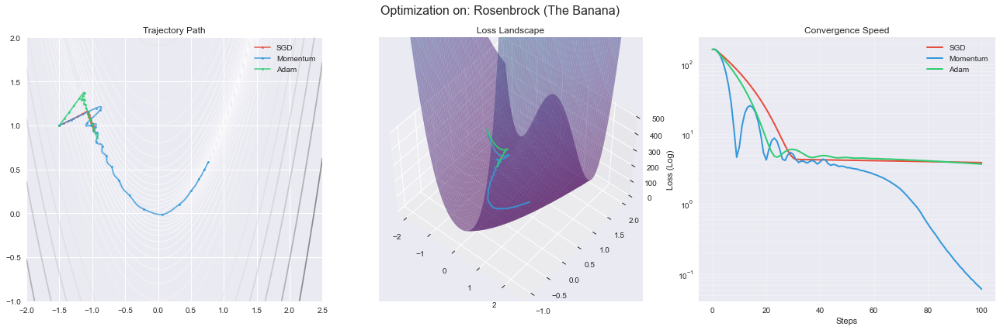

In [144]:
# Uncomment the function you wish to test:

# 1. The classic Ill-Conditioned Valley
# plot_dashboard(narrow_valley)

# 2. The Banana (Curved Valley) - Watch SGD struggle to turn!
plot_dashboard(rosenbrock)

# 3. The Trap (Local Minima) - Needs momentum to escape.
# plot_dashboard(ackley)

# 4. The Plate (Convex but slow) - Pure convergence speed test.
# plot_dashboard(matyas)

### We can also visualize animation for the gradient descent
Static plots are useful, but optimization is a dynamic process. To truly understand why Momentum overshoots and Adam succeeds, we need to watch them race.

The following code generates an interactive video directly in your notebook.

1. **Conceptual Overview**

    Before running the code, it helps to visualize the difference in trajectory logic:

- SGD stumbles down the steep slope.
- Momentum gathers speed like a heavy ball (often missing the turn).
- Adam scales the landscape, moving efficiently in a straight line.

In [145]:
def animate_optimizer_race(func=narrow_valley):
    """
    Creates an animation of the optimization process.
    Uses the FUNC_CONFIGS dictionary to automatically set limits and parameters.
    """
    # 1. Load Configuration
    if func not in FUNC_CONFIGS:
        print(f"Config not found for {func.__name__}, using defaults.")
        cfg = FUNC_CONFIGS[narrow_valley]
    else:
        cfg = FUNC_CONFIGS[func]
        
    # 2. Setup Landscape
    x_range = np.linspace(cfg["xlim"][0], cfg["xlim"][1], 100)
    y_range = np.linspace(cfg["ylim"][0], cfg["ylim"][1], 100)
    X, Y = np.meshgrid(x_range, y_range)
    X_t, Y_t = torch.from_numpy(X), torch.from_numpy(Y)
    Z = func(X_t, Y_t).numpy()
    
    # 3. Run Optimizers (Trace Paths)
    steps = 80  # Enough frames for a smooth video
    start_pos = cfg["start"]
    base_lr = cfg["base_lr"]
    clip_val = cfg.get("clip", 5.0)
    
    configs = [
        {"name": "SGD", "cls": optim.SGD, "lr": base_lr, "color": "#e74c3c", "kwargs": {}},
        {"name": "Momentum", "cls": optim.SGD, "lr": base_lr, "color": "#3498db", "kwargs": {"momentum": 0.9}},
        {"name": "Adam", "cls": optim.Adam, "lr": base_lr * 5, "color": "#2ecc71", "kwargs": {}}, 
    ]
    
    # Calculate paths using the robust tracer
    paths = []
    for c in configs:
        p, _ = trace_optimizer(
            c['cls'], start_pos, func, steps, 
            lr=c['lr'], clip=clip_val, **c['kwargs']
        )
        paths.append(p)

    # 4. Initialize Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Contour Background
    ax.contour(X, Y, Z, levels=cfg["levels"], cmap='gray_r', alpha=0.3)
    ax.set_title(f"Race on: {cfg['name']}", fontsize=14, fontweight='bold')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_xlim(cfg["xlim"])
    ax.set_ylim(cfg["ylim"])
    
    # Initialize Lines (Trails) and Dots (Heads)
    lines = [ax.plot([], [], '-', color=c['color'], lw=2, alpha=0.6)[0] for c in configs]
    dots = [ax.plot([], [], 'o', color=c['color'], label=c['name'], markersize=8)[0] for c in configs]
    ax.legend(loc='upper right')
    plt.close() # Prevent static plot artifact

    # 5. Animation Logic
    def init():
        for line, dot in zip(lines, dots):
            line.set_data([], [])
            dot.set_data([], [])
        return lines + dots

    def update(frame):
        for i, path in enumerate(paths):
            # Safe indexing: some paths might be shorter if they diverged
            current_idx = min(frame, len(path) - 1)
            
            # Update Trail
            lines[i].set_data(path[:current_idx+1, 0], path[:current_idx+1, 1])
            
            # Update Head
            dots[i].set_data([path[current_idx, 0]], [path[current_idx, 1]])
            
        return lines + dots

    # Create Animation
    ani = FuncAnimation(fig, update, frames=steps, init_func=init, blit=True, interval=80)
    return ani

# --- Run the Animation ---
# Change the function below to: narrow_valley, beale_function, rastrigin, etc.
# ani = animate_optimizer_race(himmelblau)
ani = animate_optimizer_race(rosenbrock)

HTML(ani.to_jshtml())

/opt/miniconda3/envs/ee2211/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


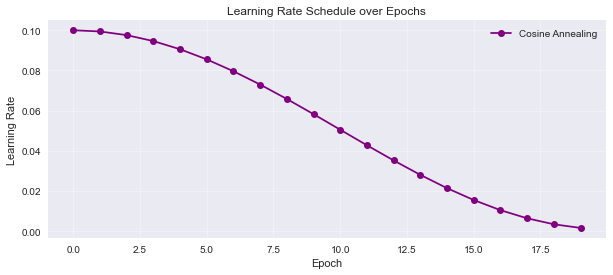

Observation: The Learning Rate decays smoothly, allowing for coarse exploration early on and fine-tuning later.


In [ ]:
# --- SUGGESTED INSERTION: Part 2.5 ---

# Part 2.5: The Pulse of Training - Learning Rate Schedulers
# ---------------------------------------------------------
# Modern deep learning rarely uses a fixed learning rate.
# We use Schedulers to "warm up" the training and then decay the LR 
# to converge to a precise minimum.

import torch.optim.lr_scheduler as lr_scheduler
import matplotlib.pyplot as plt

def visualize_scheduler():
    # Simulate a model and optimizer
    model = torch.nn.Linear(10, 1)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.1)
    
    # Define a Cosine Annealing Scheduler
    # T_max=20 means the LR descends from max to min over 20 epochs
    scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=20, eta_min=0.001)
    
    lrs = []
    epochs = 20
    for epoch in range(epochs):
        # Record current LR
        lrs.append(optimizer.param_groups[0]['lr'])
        
        # Update Scheduler (typically called at the end of every epoch)
        scheduler.step()
        
    # Plotting
    plt.figure(figsize=(10, 4))
    plt.plot(lrs, marker='o', label='Cosine Annealing', color='purple')
    plt.title("Learning Rate Schedule over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Learning Rate")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()

visualize_scheduler()
print("Observation: The Learning Rate decays smoothly, allowing for coarse exploration early on and fine-tuning later.")

---
### Part 3: Deep Signal Propagation (The Vanishing Gradient)

**Recall Slide 43 & 99:** Normalization makes the landscape spherical ($H \approx I$). 

**Context:**
In deep networks (e.g., 50+ layers), maintaining a healthy signal is difficult.
* **Forward Pass:** If weights are too small, activations decay to zero (Silence). If too large, they explode (Saturation).
* **Backward Pass:** If gradients vanish, the early layers never learn.

**The Experiment:**
We will simulate a 50-layer network and track:
1.  **Activations:** Do they stay stable around mean=0, std=1?
2.  **Gradients:** Do they survive the trip back to the input?
3.  **Heatmaps:** A visual "MRI" of neuron activity across depth.

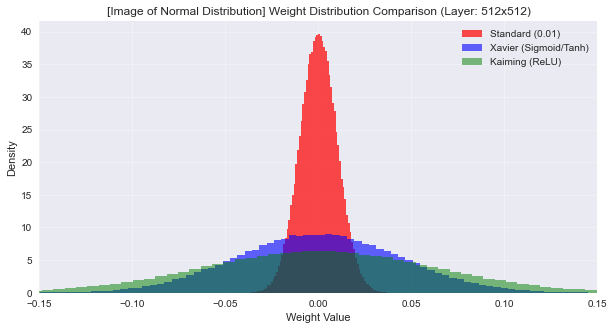

Observation: Notice how Kaiming Init (Green) is much wider than Standard Init (Red).
This extra variance is crucial to keep the signal alive through ReLU layers.


In [158]:
# Pre-Lab Visualization: The Shape of Initialization
# --------------------------------------------------
# Before simulating deep networks, let's see why Initialization matters.
# Different methods sample weights from distributions with DIFFERENT variances.
# - Standard (0.01): Too narrow. Signal dies immediately.
# - Xavier (Glorot): Wider. Good for Tanh/Sigmoid.
# - Kaiming (He): The widest. Necessary for ReLU to survive.

def plot_init_distributions():
    fan_in, fan_out = 512, 512
    
    # 1. Standard Gaussian (Mean=0, Std=0.01)
    # This is what we used in the "Collapse" experiment
    w_standard = torch.randn(fan_out, fan_in) * 0.01
    
    # 2. Xavier / Glorot Initialization
    # Std = sqrt(2 / (fan_in + fan_out))
    w_xavier = torch.empty(fan_out, fan_in)
    nn.init.xavier_normal_(w_xavier)
    
    # 3. Kaiming / He Initialization
    # Std = sqrt(2 / fan_in) -> optimized for ReLU
    w_kaiming = torch.empty(fan_out, fan_in)
    nn.init.kaiming_normal_(w_kaiming, mode='fan_in', nonlinearity='relu')
    
    # Plotting
    plt.figure(figsize=(10, 5))
    
    # Use density=True to compare shapes, distinct colors
    plt.hist(w_standard.flatten().numpy(), bins=100, density=True, alpha=0.7, color='red', label='Standard (0.01)')
    plt.hist(w_xavier.flatten().numpy(), bins=100, density=True, alpha=0.6, color='blue', label='Xavier (Sigmoid/Tanh)')
    plt.hist(w_kaiming.flatten().numpy(), bins=100, density=True, alpha=0.5, color='green', label='Kaiming (ReLU)')
    
    plt.title("[Image of Normal Distribution] Weight Distribution Comparison (Layer: 512x512)")
    plt.xlabel("Weight Value")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xlim(-0.15, 0.15) # Limit x-axis to see the differences clearly
    plt.show()

plot_init_distributions()
print("Observation: Notice how Kaiming Init (Green) is much wider than Standard Init (Red).")
print("This extra variance is crucial to keep the signal alive through ReLU layers.")

In [155]:
def simulate_network_flow(init_method, use_bn=False, use_skip=False, num_layers=50, activation=torch.relu):
    """
    Simulates a forward AND backward pass with optional Skip Connections (ResNet).
    """
    input_dim = 512
    hidden_dim = 512
    
    # 1. Construct Layers
    layers = []
    for i in range(num_layers):
        layer = nn.Linear(hidden_dim, hidden_dim, bias=False)
        
        # --- Initialization Logic ---
        if init_method == 'normal':
            # Standard Gaussian (mean=0, std=0.01) -> usually causes vanishing
            nn.init.normal_(layer.weight, mean=0, std=0.01) 
        elif init_method == 'xavier':
            nn.init.xavier_normal_(layer.weight)
        elif init_method == 'kaiming':
            nn.init.kaiming_normal_(layer.weight, nonlinearity='relu')
            
        layers.append(layer)
        
    # 2. Forward Pass (Track Activations)
    x = torch.randn(64, input_dim) 
    activation_stats = []
    raw_activations = [] 
    
    params = [] 
    
    for i, layer in enumerate(layers):
        identity = x # [ResNet] Save input for the skip connection
        
        x = layer(x)
        params.append(layer.weight)
        
        if use_bn:
            # Manual Batch Norm simulation
            mean = x.mean(dim=0, keepdim=True)
            std = x.std(dim=0, keepdim=True)
            x = (x - mean) / (std + 1e-5)
        
        if use_skip:
            # [ResNet] The Magic: Add the input signal back to the output
            x = x + identity
        
        x = activation(x)
        
        # Record stats
        activation_stats.append(x.std().item())
        
        # Save sample for heatmap (every 5th layer)
        if i % 5 == 0: 
            raw_activations.append(x.detach().numpy().flatten()[:1000]) 

    # 3. Backward Pass (Track Gradients)
    loss = x.sum() 
    loss.backward()
    
    gradient_stats = []
    for layer in layers:
        if layer.weight.grad is not None:
            gradient_stats.append(layer.weight.grad.std().item())
        else:
            gradient_stats.append(0)
            
    return activation_stats, gradient_stats, np.array(raw_activations)

In [156]:
experiments = [
    # Case 1: Baseline Failure
    {'name': 'Standard Init (The Collapse)', 'init': 'normal', 'bn': False, 'skip': False},
    # Case 2: Initialization Fix
    {'name': 'He Init (The Gold Standard)', 'init': 'kaiming', 'bn': False, 'skip': False},
    # Case 3: Batch Norm Fix
    {'name': 'Batch Norm (The Fixer)', 'init': 'normal', 'bn': True, 'skip': False}, 
    # Case 4: Architecture Fix (ResNet) 
    {'name': 'ResNet (Skip Connection)', 'init': 'normal', 'bn': False, 'skip': True} 
]

results = {}

print("Running simulations including ResNet...")
for exp in experiments:
    print(f"Simulating: {exp['name']}...")
    act_stds, grad_stds, heat_data = simulate_network_flow(
        init_method=exp['init'], 
        use_bn=exp['bn'], 
        use_skip=exp['skip']
    )
    results[exp['name']] = {
        'act': act_stds, 
        'grad': grad_stds, 
        'heat': heat_data
    }
print("Done!")

Running simulations including ResNet...
Simulating: Standard Init (The Collapse)...
Simulating: He Init (The Gold Standard)...
Simulating: Batch Norm (The Fixer)...
Simulating: ResNet (Skip Connection)...
Done!


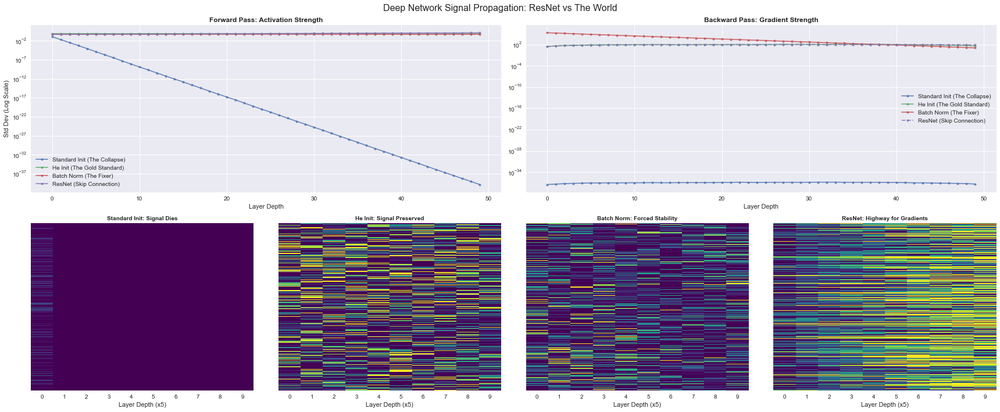

In [157]:
# Create the Dashboard
fig = plt.figure(figsize=(24, 10)) # Wider figure for 4 columns
gs = fig.add_gridspec(2, 4) # Grid: 2 Rows, 4 Columns

# 1. Forward Signal Health (Line Plot) spanning top left
ax1 = fig.add_subplot(gs[0, :2]) # Span 2 columns
for name, data in results.items():
    ax1.plot(data['act'], 'o-', label=name, markersize=4, alpha=0.8)
ax1.set_title("Forward Pass: Activation Strength", fontsize=12, fontweight='bold')
ax1.set_ylabel("Std Dev (Log Scale)")
ax1.set_xlabel("Layer Depth")
ax1.set_yscale('log')
ax1.legend()

# 2. Backward Signal Health (Line Plot) spanning top right
ax2 = fig.add_subplot(gs[0, 2:]) # Span 2 columns
for name, data in results.items():
    style = '--' if 'ResNet' in name else '-' # Make ResNet distinct
    ax2.plot(data['grad'], 'o', linestyle=style, label=name, markersize=4, alpha=0.8)
ax2.set_title("Backward Pass: Gradient Strength", fontsize=12, fontweight='bold')
ax2.set_xlabel("Layer Depth")
ax2.set_yscale('log')
ax2.legend()

# 3. Heatmaps (The "Echocardiograms")
def plot_heatmap(ax, data, title):
    # Transpose data so Layer Depth is on X-axis
    sns.heatmap(data.T, ax=ax, cmap="viridis", cbar=False, vmin=0, vmax=2)
    ax.set_title(title, fontsize=10, fontweight='bold')
    ax.set_xlabel("Layer Depth (x5)")
    ax.set_yticks([]) 

# Plot individual heatmaps
ax3 = fig.add_subplot(gs[1, 0])
plot_heatmap(ax3, results['Standard Init (The Collapse)']['heat'], "Standard Init: Signal Dies")

ax4 = fig.add_subplot(gs[1, 1])
plot_heatmap(ax4, results['He Init (The Gold Standard)']['heat'], "He Init: Signal Preserved")

ax5 = fig.add_subplot(gs[1, 2])
plot_heatmap(ax5, results['Batch Norm (The Fixer)']['heat'], "Batch Norm: Forced Stability")

ax6 = fig.add_subplot(gs[1, 3])
plot_heatmap(ax6, results['ResNet (Skip Connection)']['heat'], "ResNet: Highway for Gradients")

plt.suptitle("Deep Network Signal Propagation: ResNet vs The World", fontsize=16)
plt.tight_layout()
plt.show()

### Analysis of Results

1.  **Top Left (Activations):**
    * **Red Line (Standard):** Drops to $10^{-15}$ immediately. The network is essentially "brain dead" after layer 5.
    * **Blue Line (He Init):** Stays steady around 1.0. This allows information to flow all the way to layer 50.
    * **Green Line (BN):** Even with the "bad" initialization, Batch Norm forcibly rescales the signal back to 1.0.

2.  **Top Right (Gradients - The Most Critical):**
    * Look at the **Red Line**. It hits the bottom of the graph ($10^{-16}$) instantly.
    * This means the first layers (Layer 0, 1, 2) receive **zero gradient**. They will never update. This is why deep networks failed to train before 2015.

3.  **Bottom Row (Heatmaps):**
    * **Standard Init:** Turns dark purple (Zero activity) almost immediately.
    * **He Init:** A healthy mix of green/yellow, indicating diverse neuron firing patterns.
    * **Batch Norm:** Bright and consistent. It actively prevents the signal from dying.

---
### Part 4: Generalization I (Flat vs Sharp Minima)

**Recall Slide 114:** Sharp minima generalize poorly. Flat minima generalize well.

We train two models on noisy data:
1. **Sharp:** No Regularization (Overfits).
2. **Flat:** Dropout + Weight Decay.

We then **perturb the weights** to visualize the basin width.

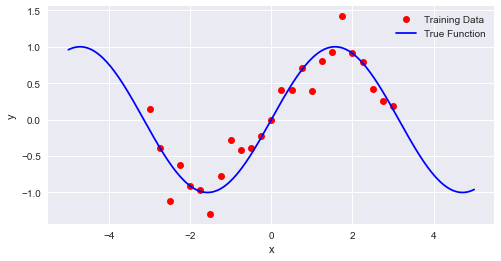

In [126]:
# 1. Generate Noisy Data (Small dataset to force overfitting)
def generate_data(n=25):
    x = torch.linspace(-3, 3, n).unsqueeze(1)
    # True function: sin(x)
    y = torch.sin(x) + 0.3 * torch.randn_like(x)  # Add noise
    return x, y

x_train, y_train = generate_data()
x_test = torch.linspace(-5, 5, 200).unsqueeze(1) # Wider range for visualization

# 2. Define the Model (Over-parameterized MLP)
class OverfitNet(nn.Module):
    def __init__(self, use_dropout=False):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(1, 200),
            nn.ReLU(),
            nn.Dropout(0.5 if use_dropout else 0.0),
            nn.Linear(200, 200),
            nn.ReLU(),
            nn.Dropout(0.5 if use_dropout else 0.0),
            nn.Linear(200, 1)
        )
    
    def forward(self, x):
        return self.net(x)
    
# plot the data
plt.figure(figsize=(8, 4))
plt.plot(x_train, y_train, 'ro', label='Training Data')
plt.plot(x_test, torch.sin(x_test), 'b-', label='True Function')
plt.xlabel('x'); plt.ylabel('y'); plt.legend(); plt.show()

In [118]:
# 3. Training Helper
def train_model(model, weight_decay=0.0, steps=2000):
    optimizer = optim.Adam(model.parameters(), lr=0.01, weight_decay=weight_decay)
    criterion = nn.MSELoss()
    
    for _ in range(steps):
        optimizer.zero_grad()
        y_pred = model(x_train)
        loss = criterion(y_pred, y_train)
        loss.backward()
        optimizer.step()
    return model

### Experiment: Training the Models

Now we train two versions of the network:
1.  **Sharp Model:** No regularization (`weight_decay=0.0`, `dropout=False`). This model is free to memorize every single data point.
2.  **Flat Model:** Regularized (`weight_decay=1e-3`, `dropout=True`). This model is forced to be "simple" and robust.

In [127]:
print("Training Sharp Model (No Regularization)...")
# No Dropout, No Weight Decay -> Prone to Sharp Minima
model_sharp = train_model(OverfitNet(use_dropout=False), weight_decay=0.0)

print("Training Flat Model (Dropout + Decay)...")
# Dropout + L2 Regularization -> Encourages Flat Minima
model_flat = train_model(OverfitNet(use_dropout=True), weight_decay=1e-3)

Training Sharp Model (No Regularization)...
Training Flat Model (Dropout + Decay)...


### Visualization: The Basin of Attraction

How do we measure if a minimum is "Flat" or "Sharp"?
We perform a **Perturbation Analysis**:
1.  Take the trained weights.
2.  Push them in a random direction by a small amount ($\alpha$).
3.  Check if the Loss explodes.

* If a small push causes a huge loss increase, we are in a **Sharp Minimum** (unstable).
* If the loss stays low despite the push, we are in a **Flat Minimum** (robust).

In [128]:
import copy
def get_loss_landscape(model, x, y, range_alpha=1.0):
    """
    Perturbs the trained weights in a random normalized direction 
    and measures how fast the loss shoots up.
    """
    criterion = nn.MSELoss()
    original_state = copy.deepcopy(model.state_dict())
    
    # 1. Generate a random normalized direction vector for every parameter
    direction = {}
    for k, v in original_state.items():
        d = torch.randn_like(v)
        # Normalize to keep perturbation scale consistent
        d = d / (d.norm() + 1e-10) * v.norm() 
        direction[k] = d

    # 2. Sweep alpha (magnitude of perturbation)
    alphas = np.linspace(-range_alpha, range_alpha, 50)
    losses = []
    
    model.eval() # Disable dropout for evaluation
    with torch.no_grad():
        for a in alphas:
            # Perturb weights: W_new = W_old + alpha * random_direction
            for k, v in original_state.items():
                model.state_dict()[k].copy_(v + a * direction[k])
            
            loss = criterion(model(x), y)
            losses.append(loss.item())
            
    # Restore original weights
    model.load_state_dict(original_state)
    return alphas, np.array(losses)

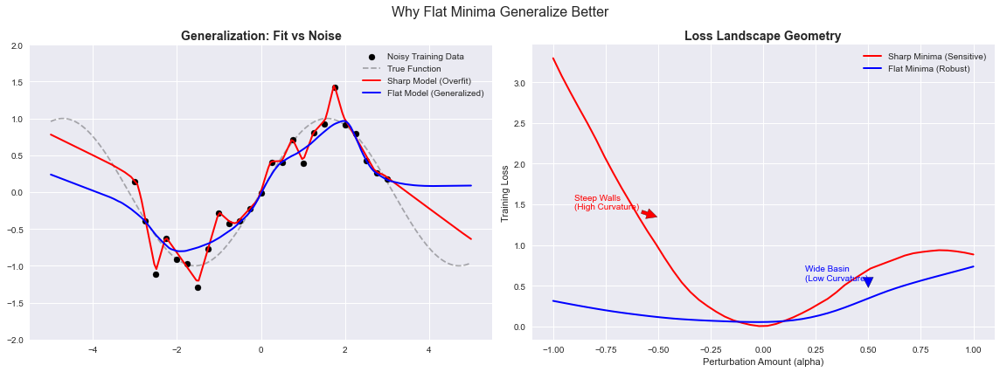

In [129]:
# Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Subplot 1: Function Fit (Generalization)
model_sharp.eval()
model_flat.eval()
with torch.no_grad():
    ax1.scatter(x_train, y_train, c='black', label='Noisy Training Data')
    ax1.plot(x_test, torch.sin(x_test), 'k--', alpha=0.3, label='True Function')
    ax1.plot(x_test, model_sharp(x_test), 'r-', label='Sharp Model (Overfit)', linewidth=2)
    ax1.plot(x_test, model_flat(x_test), 'b-', label='Flat Model (Generalized)', linewidth=2)

ax1.set_title("Generalization: Fit vs Noise", fontsize=14, fontweight='bold')
ax1.set_ylim(-2, 2)
ax1.legend()

# Subplot 2: The Basin of Attraction (Perturbation Analysis)
alphas, loss_sharp = get_loss_landscape(model_sharp, x_train, y_train)
_, loss_flat = get_loss_landscape(model_flat, x_train, y_train)

ax2.plot(alphas, loss_sharp, 'r-', label='Sharp Minima (Sensitive)', linewidth=2)
ax2.plot(alphas, loss_flat, 'b-', label='Flat Minima (Robust)', linewidth=2)

# Annotations
ax2.annotate('Steep Walls\n(High Curvature)', xy=(-0.5, loss_sharp[10]), xytext=(-0.9, loss_sharp[10]+0.1),
             arrowprops=dict(facecolor='red', shrink=0.05), color='red')
ax2.annotate('Wide Basin\n(Low Curvature)', xy=(0.5, loss_flat[40]), xytext=(0.2, loss_flat[40]+0.1),
             arrowprops=dict(facecolor='blue', shrink=0.05), color='blue')

ax2.set_title("Loss Landscape Geometry", fontsize=14, fontweight='bold')
ax2.set_xlabel("Perturbation Amount (alpha)")
ax2.set_ylabel("Training Loss")
ax2.legend()

plt.suptitle("Why Flat Minima Generalize Better", fontsize=16)
plt.tight_layout()
plt.show()

---
### Part 5: Modern Regularization (Mixup)

**Objective:** Implement Mixup regularization (Zhang et al., 2017) to train a robust classifier on MNIST.

**Core Idea:** 
Instead of feeding the network raw images, we feed it linear combinations of random image pairs:
$$ \tilde{x} = \lambda x_i + (1-\lambda) x_j $$
$$ \tilde{y} = \lambda y_i + (1-\lambda) y_j $$

This forces the model to behave linearly between classes, reducing overconfidence and improving generalization.

In [47]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


#### Part 5.1: Visualizing Mixup
Before training, let's visualize what the network actually sees.

Visualizing Mixup interpolation:


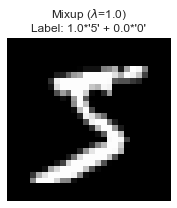

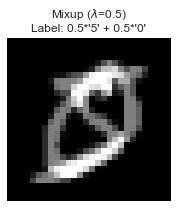

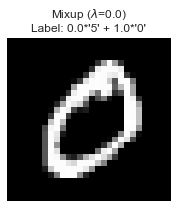

In [48]:
# Load 2 MNIST images for demonstration
ds_demo = datasets.MNIST('./data', download=True, train=True, transform=transforms.ToTensor())
img1, label1 = ds_demo[0] # Usually a 5
img2, label2 = ds_demo[1] # Usually a 0

def show_mixup(alpha=0.5):
    # Mixup equation
    mixed_img = alpha * img1 + (1 - alpha) * img2
    
    plt.figure(figsize=(3, 3))
    plt.imshow(mixed_img.squeeze(), cmap='gray')
    plt.title(f"Mixup ($\lambda$={alpha})\nLabel: {alpha:.1f}*'{label1}' + {1-alpha:.1f}*'{label2}'")
    plt.axis('off')
    plt.show()

# Visualize transition
print("Visualizing Mixup interpolation:")
show_mixup(1.0) # Pure Image 1
show_mixup(0.5) # 50/50 Mix
show_mixup(0.0) # Pure Image 2

#### Part 2: Implementing the Mixup Logic

We need two functions:
1.  `mixup_data`: Takes a batch $(x, y)$, shuffles it to get pairs, samples $\lambda$ from Beta distribution, and returns mixed inputs.
2.  `mixup_criterion`: Computes the weighted loss.

In [49]:
def mixup_data(x, y, alpha=1.0):
    '''Returns mixed inputs, pairs of targets, and lambda'''
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1

    batch_size = x.size(0)
    index = torch.randperm(batch_size).to(device)

    # Create mixed input
    mixed_x = lam * x + (1 - lam) * x[index]
    
    # Return targets for both original images
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam


def mixup_criterion(criterion, pred, y_a, y_b, lam):
    '''Weighted loss function'''
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

#### Part 3: Model & Training Loop
We will train a simple CNN.

In [50]:
# 1. Data Loaders
batch_size = 64
train_loader = DataLoader(
    datasets.MNIST('./data', train=True, download=True, 
                   transform=transforms.Compose([
                       transforms.ToTensor(),
                       transforms.Normalize((0.1307,), (0.3081,))
                   ])),
    batch_size=batch_size, shuffle=True)

test_loader = DataLoader(
    datasets.MNIST('./data', train=False, transform=transforms.Compose([
                       transforms.ToTensor(),
                       transforms.Normalize((0.1307,), (0.3081,))
                   ])),
    batch_size=1000, shuffle=True)

# 2. Simple CNN Model
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.fc1 = nn.Linear(9216, 128)
        self.fc2 = nn.Linear(128, 10)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(2)
        self.dropout = nn.Dropout(0.25)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.dropout(x)
        x = torch.flatten(x, 1)
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        return x

model = SimpleCNN().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
base_criterion = nn.CrossEntropyLoss()

In [51]:
# 3. Training Function
def train(epoch, alpha=1.0):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        
        # --- MIXUP MAGIC STARTS HERE ---
        # 1. Generate mixed inputs and targets
        data, targets_a, targets_b, lam = mixup_data(data, target, alpha)
        
        # 2. Forward pass
        optimizer.zero_grad()
        output = model(data)
        
        # 3. Calculate loss using mixup criterion
        loss = mixup_criterion(base_criterion, output, targets_a, targets_b, lam)
        # --- MIXUP MAGIC ENDS HERE ---
        
        loss.backward()
        optimizer.step()
        
        if batch_idx % 200 == 0:
            print(f'Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)}]\tLoss: {loss.item():.6f}')

# 4. Test Function (Standard evaluation - no mixup on test!)
def test():
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += base_criterion(output, target).item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    print(f'\nTest set: Average loss: {test_loss:.4f}, Accuracy: {correct}/{len(test_loader.dataset)} ({100. * correct / len(test_loader.dataset):.2f}%)\n')

In [ ]:
# Run Training
epochs = 3
for epoch in range(1, epochs + 1):
    # alpha=1.0 samples lambda from Uniform(0,1) roughly, 
    # alpha=0.2 samples lambda heavily near 0 or 1 (safer).
    train(epoch, alpha=0.4) 
    test()

## Final Takeaways
1. **Optimizers matter:** Adam adapts to geometry; SGD + Noise finds flat minima.
2. **Architecture matters:** ResNets and Batch Norm allow signals to flow.
3. **Scale matters:** Larger models (Double Descent) can actually generalize better if trained well.